In [1]:
import numpy as np
import os
import shutil
import time
import cv2
import random
import dicom_global_params
import dicom_cat_params
from dicom_image_functions import read_images, show_images, save_images, merge_images
import dicom_bit_functions as bf

# **Read plain images**

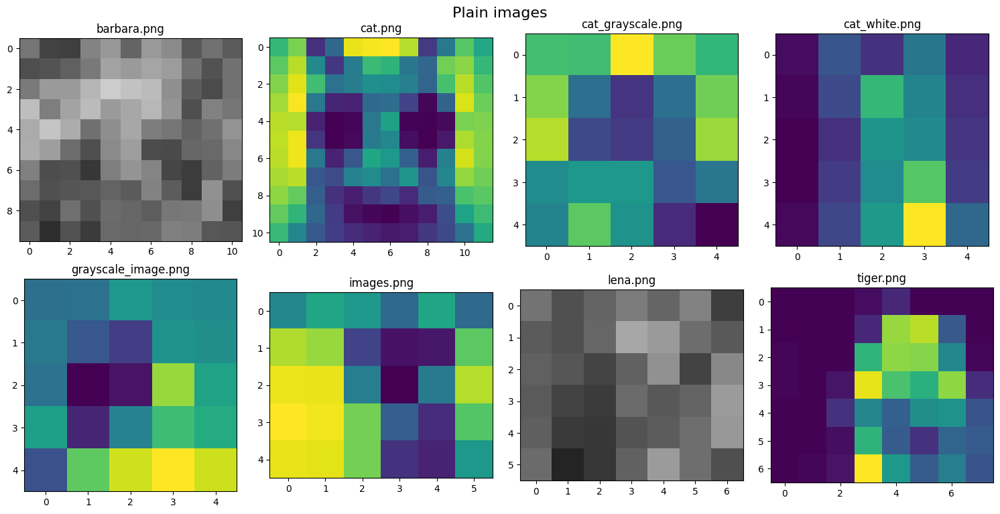

1. Images' sizes:  [[10, 11], [11, 12], [5, 5], [5, 5], [5, 5], [5, 6], [6, 7], [7, 8]]
2. Number of bits:  [16, 8, 8, 8, 8, 8, 16, 8]
3. real_M_max:  11
4. real_N_max:  12


In [2]:
list_os = ['Windows', 'Linux']
OS = list_os[0]
path = 'C:\\Users\\Admin\\Documents\\DICOM\\DICOM_MIE_Cryptography\\' if OS == 'Windows' else '/home/anhpq0/DICOM_MIE_Cryptography/'
dir_plain = path + 'plain_images'

# User IDs and Image IDs
# ID: List of User IDs and Image IDs ([[user_id_1, image_id_0], [user_id_1, image_id_1], [user_id_1, image_id_2], ...])
ID = []
id_user = 0
id_image = 0

# List of images' sizes
list_im_size = []

# List of number of bits
list_num_bits_pre = []

R_iterations = 5
im_base_size = 8

# Read images
I_plains = os.listdir(dir_plain)
N_files = len(I_plains)
kI = []
str_Fnames = []

for i in range(0, N_files):
    size_0 = (im_base_size + i) % 10 + 2 if (im_base_size + i) % 10 + 2 > 4 else 5
    size_1 = (im_base_size + i) % 10 + 3 if (im_base_size + i) % 10 + 3 > 4 else 5
    size = (size_0,
            size_1)
    list_im_size.append([size[0], size[1]])

    name = I_plains[i]
    str_Fnames.append(name)
    if (size[0] % 2):
        Ip = cv2.imread(dir_plain + '\\' + name if OS == 'Windows' else dir_plain + '/' + name, 0)
        Ip_resized = cv2.resize(Ip, (size[1], size[0]), interpolation = cv2.INTER_AREA)
        Ip_resized = np.uint8(Ip_resized)
        list_num_bits_pre.append(8)
        kI.append(Ip_resized)
        ID.append([id_user, id_image])
    else:
        Ip = cv2.imread(dir_plain + '\\' + name if OS == 'Windows' else dir_plain + '/' + name)
        Ip_resized = cv2.resize(Ip, (size[1], size[0]), interpolation = cv2.INTER_AREA)
        Ip_resized = np.uint16(Ip_resized)
        list_num_bits_pre.append(16)
        (B, G, R) = cv2.split(Ip_resized)
        kI.append(B)
        kI.append(G)
        kI.append(R)
        ID.append([id_user, id_image])
        ID.append([id_user, id_image])
        ID.append([id_user, id_image])
    id_user += 1
    id_image += 1

# Show images
kI_merge = merge_images(kI = kI, ID = ID)
show_images(kI = kI_merge, suptitle = 'Plain images', str_Fnames = str_Fnames, size = (15, 15), rows = 4, cols = 4)

# Destination folder
dir_cipher = path + 'cipher_images' + dicom_global_params.NamePCM

if (os.path.exists(dir_cipher)):
    shutil.rmtree(dir_cipher)
os.mkdir(dir_cipher)

# Decrypted images folder
dir_decrypted = path + 'decrypted' + dicom_global_params.NamePCM

if (os.path.exists(dir_decrypted)):
    shutil.rmtree(dir_decrypted)
os.mkdir(dir_decrypted)

# Images' sizes
print("1. Images' sizes: ", list_im_size)
real_M_max = 0
real_N_max = 0

for i in range(0, N_files):
    if (list_im_size[i][0] > real_M_max):
        real_M_max = list_im_size[i][0]
    if (list_im_size[i][1] > real_N_max):
        real_N_max = list_im_size[i][1]

# Number of bits
print("2. Number of bits: ", list_num_bits_pre)

print("3. real_M_max: ", real_M_max)
print("4. real_N_max: ", real_N_max)

# **Parameters**

In [3]:
# S0
S0 = ''.join(random.choice(['0', '1']) for _ in range(dicom_global_params.S_len))

# PCF
PCF = [("0" * dicom_global_params.NB_max) for _ in range(dicom_global_params.K)]

# RCPK
RCPK = [("0" * dicom_global_params.pk_len) for _ in range(dicom_global_params.K)]

# kC
kC = kI.copy()

#kC-
# kC_minus = np.copy(dicom_global_params.kC0)
kC_minus = [dicom_global_params.kC0[0]]
k = 0
last_id_image = ID[0][1]
for i in range(1, len(ID)):
    new_id_image = ID[i][1]
    if (new_id_image != last_id_image):
        k += 1
    kC_minus.append([dicom_global_params.kC0[k][0]])
    last_id_image = new_id_image
kC_minus = np.asarray(kC_minus)

#kP+
# kP_plus = np.copy(dicom_global_params.kP0)
kP_plus = []

for i in range(len(ID)):
    kP_plus.append([kC[i][0][1]])
kP_plus = np.asarray(kP_plus)

print("1. S0: ", S0)
print("\n2. PCF: ", PCF)
print("\n3. RCPK: ", RCPK)
print("\n4. kC_minus: ", kC_minus)
print("\n5. kP_plus: ", kP_plus)

1. S0:  000001011001101001111100110110101110111111011000000111110000001111011111101111110011111101110111000100100001011110010100010001001010111000000001111100101101100001110111000101000010110011101100111100111001010001100110001110101100011101101011001000100000111000010110000010000011001101000000

2. PCF:  ['0000000000000000', '0000000000000000', '0000000000000000', '0000000000000000', '0000000000000000', '0000000000000000', '0000000000000000', '0000000000000000']

3. RCPK:  ['00000000000000000000000000000000000000000', '00000000000000000000000000000000000000000', '00000000000000000000000000000000000000000', '00000000000000000000000000000000000000000', '00000000000000000000000000000000000000000', '00000000000000000000000000000000000000000', '00000000000000000000000000000000000000000', '00000000000000000000000000000000000000000']

4. kC_minus:  [[123]
 [123]
 [123]
 [ 11]
 [ 27]
 [ 88]
 [ 33]
 [211]
 [ 97]
 [ 97]
 [ 97]
 [ 63]]

5. kP_plus:  [[ 66]
 [ 66]
 [ 66]
 [178]
 [114]
 [ 75]
 [12

In [4]:
# Rules of bit arrangement (list of numpy arrays)
Yp_MN = dicom_cat_params.Yp_16x16_Cat

# **Encryption**

In [5]:
print("---------------------------------------------------------")
print("\t\tEncryption Initial Parameters")
print("---------------------------------------------------------")

print("1. kC: \n", kC)
print("\n2. kC_minus: \n", kC_minus)
print("\n3. kP_plus: \n", kP_plus)

# Key Sharing Scheme
PK, RVK = bf.key_sharing_scheme(S0)
PK0 = PK.copy()
print("\n4. PK: \n", PK, "\n")
print("\n5. RVK: \n", RVK, "\n")

S = str(S0)
print("6. S: \n", S)
print("\n\n")

print("=============================START ENCRYPTION PROCESSING=============================")

for n in range(dicom_global_params.Ne):
    start_time = time.time() # Record start time in seconds unit
    print("\n")
    print("\t---------------------------------------------------------")
    print("\t-------------------|      STEP ",n,"   |-------------------")
    print("\t---------------------------------------------------------\n")
    for i in range(real_M_max):
        for j in range(real_N_max):
            print("\n------------------------")
            print("|    Pixel ["+ str(i)+ "], [" + str(j) + "]    |")
            print("------------------------")

            # phi_S
            phi_S = bf.cal_phi_S(n       = n                         , 
                                 XY      = [i, j]                    , 
                                 rvk_K   = RVK[dicom_global_params.K] )

            print("1. phi_S: \n", phi_S, "\n")

            # Update PK
            PK = bf.update_private_key(XY           = [i, j]      , 
                                       PK           = PK          , 
                                       phi_S        = phi_S       , 
                                       list_im_size = list_im_size )
            print("2. PK: \n", PK, "\n")

            # Private Constraint Function
            PCF = bf.private_constraint_function(ID           = ID          , 
                                                 PCF          = PCF         , 
                                                 PK           = PK          , 
                                                 XY           = [i, j]      , 
                                                 kP_plus      = kP_plus     , 
                                                 kC_minus     = kC_minus    , 
                                                 list_im_size = list_im_size )
            print("3. PCF: \n", PCF, "\n")

            # Update S
            S = bf.update_S(S0     = S0  , 
                            phi_S = phi_S )
            print("4. S: \n", S)

            # Bit Manipulation before Cat PCM
            E = bf.bit_manipulation(s1          = S                      , 
                                    s2          = ""                     , 
                                    output_size = dicom_cat_params.k1_cat )
            print("\n5. E: \n", E, "\n")

            # PCM Cat
            X_R = bf.pcm_cat(E           = E                           , 
                             Y1_FAST_Cat = dicom_cat_params.Y1_FAST_Cat, 
                             Y2_FAST_Cat = dicom_cat_params.Y2_FAST_Cat, 
                             Y3_FAST_Cat = dicom_cat_params.Y3_FAST_Cat, 
                             Y4_FAST_Cat = dicom_cat_params.Y4_FAST_Cat, 
                             R           = R_iterations                 )
            print("6. X_R: \n", X_R, "\n")

            # XY, phi generation
            XY_new, phi_source, phi_dest = bf.xy_phi_generation(X_R              = X_R                               , 
                                                                Yp_MN            = Yp_MN                             , 
                                                                Y_phi_source     = dicom_cat_params.Yd_phi_source_Cat, 
                                                                Y_phi_dest       = dicom_cat_params.Yd_phi_dest_Cat   )
            print("7. XY_new: \n", XY_new, "\n")
            print("8. phi_source: \n", phi_source, "\n")
            print("9. phi_dest: \n", phi_dest, "\n")

            # Bit Pre-processing for all images
            XY_P, phi_source_P, phi_dest_P = bf.bit_pre_processing(XY                = [i, j]           , 
                                                                   XY_new            = XY_new           , 
                                                                   PCF               = PCF              , 
                                                                   phi_source        = phi_source       , 
                                                                   phi_dest          = phi_dest         , 
                                                                   list_im_size      = list_im_size     , 
                                                                   list_num_bits_pre = list_num_bits_pre )
            print("10. XY_P: \n", XY_P, "\n")
            print("11. phi_source_P: \n", phi_source_P, "\n")
            print("12. phi_dest_P: \n", phi_dest_P, "\n")

            # Permutation and Diffusion for Encryption process
            kC_minus, kP_plus, kC = bf.dicom_mie_perm_diff_enc(ID                = ID               , 
                                                               kI                = kC               , 
                                                               XY                = [i, j]           , 
                                                               XY_P              = XY_P             , 
                                                               phi_source_P      = phi_source_P     , 
                                                               phi_dest_P        = phi_dest_P       , 
                                                               prev_kP_plus      = kP_plus          , 
                                                               kC_minus          = kC_minus         , 
                                                               list_im_size      = list_im_size     , 
                                                               n                 = n                 )
            print("\n13. kC_minus: \n", kC_minus)
            print("\n14. kP_plus: \n", kP_plus)
            print("\n15. kC: \n", kC)

            # Save recovery codes of PK
            RCPK = bf.save_recover_code_PK(n            = n           , 
                                           XY           = [i, j]      , 
                                           PK0          = PK0         , 
                                           PK           = PK          , 
                                           RCPK         = RCPK        , 
                                           list_im_size = list_im_size )
            print("\n16. RCPK: \n", RCPK)

    end_time = time.time() # Record end time in senconds unit
    print("Simulation time of step ", n, ": ", end_time - start_time)

kC_merge = merge_images(kI = kC, 
                        ID = ID )

save_images(kC          = kC_merge  , 
            folder_path = dir_cipher, 
            str_Fnames  = str_Fnames )

---------------------------------------------------------
		Encryption Initial Parameters
---------------------------------------------------------
1. kC: 
 [array([[117,  66,  63, 131, 152, 100, 153, 139,  88, 113,  91],
       [ 78,  83,  96, 121, 163, 154, 165, 156, 112,  82, 113],
       [122, 154, 154, 182, 204, 194, 187, 143,  91,  75, 113],
       [190, 126, 163, 187, 154, 167, 183, 148,  79, 129, 118],
       [171, 196, 172, 112, 142, 167, 125, 117,  98, 112, 147],
       [173, 158, 108,  78, 138, 158,  76,  74, 102, 105, 135],
       [128,  77,  80,  55, 126, 148, 132,  70,  60,  98, 124],
       [108,  80,  85,  87,  99,  91, 130,  92,  60, 145,  80],
       [ 79,  66, 111,  80, 107, 102,  93, 119, 121, 142,  63],
       [ 91,  45,  81,  59, 105, 102, 104, 128, 125,  87,  85]],
      dtype=uint16), array([[117,  66,  63, 131, 152, 100, 153, 139,  88, 113,  91],
       [ 78,  83,  96, 121, 163, 154, 165, 156, 112,  82, 113],
       [122, 154, 154, 182, 204, 194, 187, 143,  91,

# **Read cipher image**

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1. Images' sizes:  [[10, 11], [11, 12], [5, 5], [5, 5], [5, 5], [5, 6], [6, 7], [7, 8]]
2. Number of bits:  [16, 8, 8, 8, 8, 8, 16, 8]
3. real_M_max:  11
4. real_N_max:  12


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


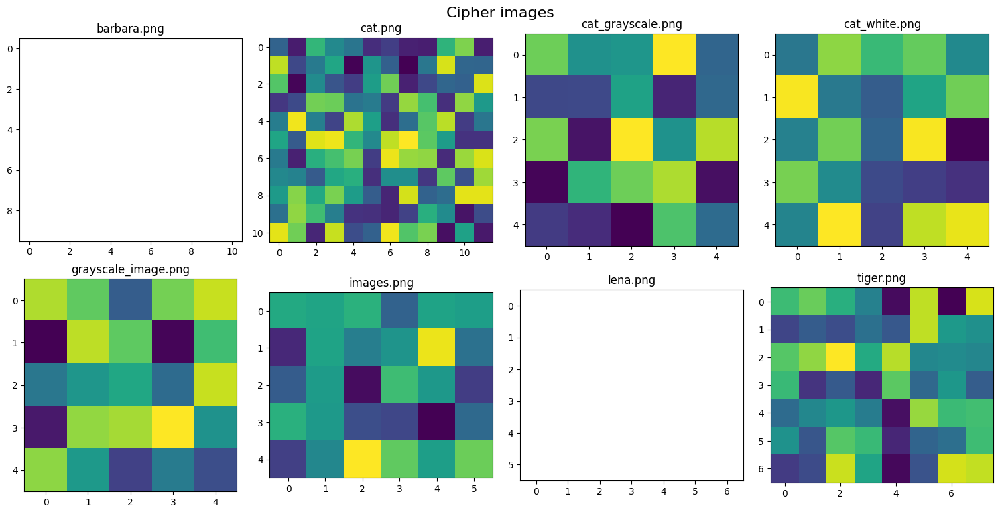

5. kC_cipher_minus:  [[30698]
 [30698]
 [30698]
 [  145]
 [  154]
 [  222]
 [  110]
 [  145]
 [ 2177]
 [ 2177]
 [ 2177]
 [  232]]
6. kP_cipher_plus:  [[ 64]
 [ 64]
 [ 64]
 [154]
 [ 37]
 [ 73]
 [ 17]
 [ 56]
 [ 72]
 [ 72]
 [ 72]
 [ 68]]


In [6]:
# Read images
I_ciphers = os.listdir(dir_cipher)
N_files = len(I_ciphers)
kI_cipher = []
str_Fnames_cipher = str_Fnames.copy()

# Images' sizes
print("1. Images' sizes: ", list_im_size)
real_M_max = 0
real_N_max = 0

for i in range(0, N_files):
    if (list_im_size[i][0] > real_M_max):
        real_M_max = list_im_size[i][0]
    if (list_im_size[i][1] > real_N_max):
        real_N_max = list_im_size[i][1]

# Number of bits
print("2. Number of bits: ", list_num_bits_pre)

print("3. real_M_max: ", real_M_max)
print("4. real_N_max: ", real_N_max)

for i in range(0, N_files):
    name = I_ciphers[i]
    if (list_im_size[i][0] % 2):
        Ip = cv2.imread(dir_cipher + '\\' + name if OS == 'Windows' else dir_cipher + '/' + name, cv2.IMREAD_ANYDEPTH)
        Ip_resized = cv2.resize(Ip, (list_im_size[i][1], list_im_size[i][0]), interpolation = cv2.INTER_AREA)
        Ip_resized = np.uint8(Ip_resized)
        kI_cipher.append(Ip_resized)
    else:
        Ip = cv2.imread(dir_cipher + '\\' + name if OS == 'Windows' else dir_cipher + '/' + name, cv2.IMREAD_UNCHANGED)
        Ip_bgr = cv2.cvtColor(Ip, cv2.COLOR_BGRA2BGR)
        Ip_resized = cv2.resize(Ip_bgr, (list_im_size[i][1], list_im_size[i][0]), interpolation = cv2.INTER_AREA)
        Ip_resized = np.uint16(Ip_resized)
        (B, G, R) = cv2.split(Ip_resized)
        kI_cipher.append(B)
        kI_cipher.append(G)
        kI_cipher.append(R)
    id_user += 1
    id_image += 1

# Show images
kI_cipher_merge = merge_images(kI = kI_cipher, ID = ID)
show_images(kI = kI_cipher_merge, suptitle = 'Cipher images', str_Fnames = str_Fnames_cipher, size = (15, 15), rows = 4, cols = 4)

# kC_cipher
kC_cipher = kI_cipher.copy()

#kC_cipher-
kC_cipher_minus = []

k = 0
last_id_image = ID[0][1]
for i in range(len(ID)):
    new_id_image = ID[i][1]
    if (new_id_image != last_id_image):
        k += 1
    kC_cipher_minus.append([kC_cipher[i][list_im_size[k][0]-1][list_im_size[k][1]-2]])
    last_id_image = new_id_image
kC_cipher_minus = np.asarray(kC_cipher_minus)

#kP_cipher+
kP_cipher_plus = []

k = 0
last_id_image = ID[0][1]
for i in range(len(ID)):
    new_id_image = ID[i][1]
    if (new_id_image != last_id_image):
        k += 1
    kP_cipher_plus.append([dicom_global_params.kP0[k][0]])
    last_id_image = new_id_image
kP_cipher_plus = np.asarray(kP_cipher_plus)

print("5. kC_cipher_minus: ", kC_cipher_minus)
print("6. kP_cipher_plus: ", kP_cipher_plus)

# **Decryption for Single Image**

---------------------------------------------------------
		Decryption Initial Parameters
---------------------------------------------------------
1. kC_cipher[1]: 
 [array([[ 81,  19, 168, 120,  99,  33,  47,  23,  21, 165, 205,  21],
       [230,  55, 104, 150,   1, 132,  78,   0, 101, 239,  84,  83],
       [186,   3, 123,  67,  46, 141, 199,  23,  55,  84,  79, 241],
       [ 41,  57, 200, 197,  97, 106,  44, 214, 179,  34, 212, 136],
       [108, 249, 110,  52, 223, 143,  34,  92, 188, 228,  45, 100],
       [149,  73, 242, 248, 167, 120, 230, 254, 190, 140,  37,  37],
       [105,  23, 160, 179, 202,  46, 247, 215, 212,  31, 216, 240],
       [119, 113,  73, 152, 160,  34, 126, 126,  41, 191,  63, 218],
       [138, 208, 153, 203, 140,  75,  26, 238,  80,  91, 244, 244],
       [ 94, 212, 176, 109,  37,  35,  26,  50, 160, 123,  13,  59],
       [244, 199,  27, 233,  60,  79, 249, 185, 203,  10, 145,  17]],
      dtype=uint8)]

2. kC_cipher_minus: 
 [[145]]

3. kP_cipher_plus: 


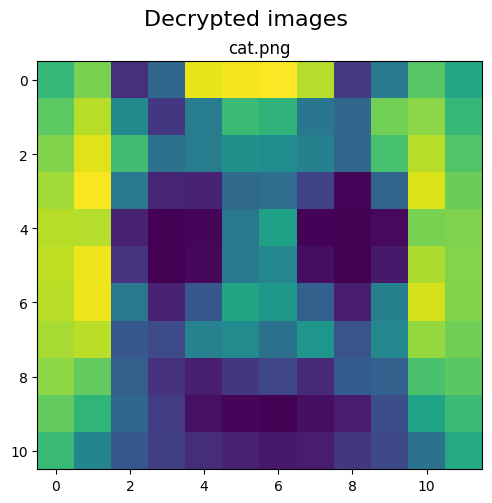

In [7]:
print("---------------------------------------------------------")
print("\t\tDecryption Initial Parameters")
print("---------------------------------------------------------")

# Order of image user want to decrypt
k = 1

# kC_cipher_minus
kC_cipher_minus_k = []

# kP_cipher_plus
kP_cipher_plus_k = []

# kC_cipher_k
kC_cipher_k = []

image_k = 0
last_id_image = ID[0][1]
for i in range(len(ID)):
    new_id_image = ID[i][1]
    if (new_id_image != last_id_image):
        image_k += 1
    if (image_k == k):
        kC_cipher_minus_k.append([kC_cipher[i][list_im_size[k][0] - 1][list_im_size[k][1] - 2]])
        kP_cipher_plus_k.append([dicom_global_params.kP0[k][0]])
        kC_cipher_k.append(kC_cipher[i].copy())
    elif (image_k > k):
        break
    last_id_image = new_id_image

print("1. kC_cipher[" + str(k) + "]: \n", kC_cipher_k)
print("\n2. kC_cipher_minus: \n", kC_cipher_minus_k)
print("\n3. kP_cipher_plus: \n", kP_cipher_plus_k)
print("\n4. RVK: \n", RVK)
print("\n5. PK0: \n", PK0)

# Recover shared key
system_equations = RVK.copy()
system_equations[k] = PK0[k]
S0 = bf.recover_shared_key(system_equations)
print("\n6. system_equations: \n", system_equations)
print("\n7. S0: \n", S0)
S = str(S0)
print("\n8. S: \n", S)

# pk_K
pk_k = bf.xor(PK0[k], RCPK[k])
print("\n9. pk_k: \n", pk_k)

pcf_k = "0" * dicom_global_params.NB_max
print("\n10. pcf_k: ", pcf_k)

print("\n\n")

print("=============================START DECRYPTION PROCESSING=============================")
for n in range(dicom_global_params.Ne - 1, -1, -1):
    start_time = time.time() # Record start time in seconds unit
    print("\n")
    print("\t---------------------------------------------------------")
    print("\t-------------------|      STEP ",n,"   |-------------------")
    print("\t---------------------------------------------------------\n")
    for i in range(list_im_size[k][0] - 1, -1, -1):
        for j in range(list_im_size[k][1] - 1, -1, -1):
            print("------------------------")
            print("|    Pixel ["+ str(i)+ "], [" + str(j) + "]    |")
            print("------------------------")

            # phi_S
            phi_S = bf.cal_phi_S(n       = n                         , 
                                 XY      = [i, j]                    , 
                                 rvk_K   = RVK[dicom_global_params.K] )
            print("\n1. phi_S: \n", phi_S, "\n")

            # Private Constraint Function
            pcf_k = bf.private_constraint_function_k(pk_k    = pk_k             , 
                                                     p_plus  = kP_cipher_plus_k ,
                                                     c_minus = kC_cipher_minus_k )
            print("2. pcf_k: \n", pcf_k, "\n")

            # Update S
            S = bf.update_S(S0     = S0  , 
                            phi_S = phi_S )
            print("3. S: \n", S)

            # Bit Manipulation before Cat PCM
            E = bf.bit_manipulation(s1          = S                      , 
                                    s2          = ""                     , 
                                    output_size = dicom_cat_params.k1_cat )
            print("\n4. E: \n", E, "\n")

            # PCM Cat
            X_R = bf.pcm_cat(E           = E                           , 
                             Y1_FAST_Cat = dicom_cat_params.Y1_FAST_Cat, 
                             Y2_FAST_Cat = dicom_cat_params.Y2_FAST_Cat, 
                             Y3_FAST_Cat = dicom_cat_params.Y3_FAST_Cat, 
                             Y4_FAST_Cat = dicom_cat_params.Y4_FAST_Cat, 
                             R           = R_iterations                 )
            print("\n5. X_R: \n", X_R, "\n")

            # XY, phi generation
            XY_new_k, phi_source_k, phi_dest_k = bf.xy_phi_generation_k(k                = k                                 , 
                                                                        X_R              = X_R                               , 
                                                                        Yp_MN            = Yp_MN                             , 
                                                                        Y_phi_source     = dicom_cat_params.Yd_phi_source_Cat, 
                                                                        Y_phi_dest       = dicom_cat_params.Yd_phi_dest_Cat   )
            print("\n6. XY_new_k: \n", XY_new_k, "\n")
            print("7. phi_source_k: \n", phi_source_k, "\n")
            print("8. phi_dest_k: \n", phi_dest_k, "\n")

            # Bit Pre-processing for all images
            XY_Pk, phi_source_Pk, phi_dest_Pk = bf.bit_pre_processing_k(XY_k           = [i, j]              , 
                                                                        XY_new_k       = XY_new_k            , 
                                                                        pcf_k          = pcf_k               , 
                                                                        phi_source_k   = phi_source_k        , 
                                                                        phi_dest_k     = phi_dest_k          , 
                                                                        M_k            = list_im_size[k][0]  , 
                                                                        N_k            = list_im_size[k][1]  , 
                                                                        num_bits_pre_k = list_num_bits_pre[k] )
            print("\n9. XY_Pk: \n", XY_Pk, "\n")
            print("10. phi_source_Pk: \n", phi_source_Pk, "\n")
            print("11. phi_dest_Pk: \n", phi_dest_Pk, "\n")

            # Permutation and Diffusion for Decryption process
            kC_cipher_minus_k, kP_cipher_plus_k, kC_cipher_k = bf.dicom_mie_perm_diff_dec_mc_k(k             = k                   , 
                                                                                               kC            = kC_cipher_k         , 
                                                                                               XY            = [i, j]              , 
                                                                                               XY_Pk         = XY_Pk               , 
                                                                                               phi_source_Pk = phi_source_Pk       , 
                                                                                               phi_dest_Pk   = phi_dest_Pk         , 
                                                                                               kC_minus      = kC_cipher_minus_k   , 
                                                                                               M_k           = list_im_size[k][0]  , 
                                                                                               N_k           = list_im_size[k][1]  , 
                                                                                               n             = n                    )
            print("\n12. kC_cipher_minus_k: \n", kC_cipher_minus_k, "\n")
            print("\n13. kP_cipher_plus_k: \n", kP_cipher_plus_k, "\n")
            print("\n14. kC_cipher_k: \n", kC_cipher_k, "\n")

            # Update PK
            pk_k = bf.update_private_key_k(k     = k                 , 
                                           pk_k  = pk_k              , 
                                           phi_S = phi_S              )
            print("15. pk_k: \n", pk_k, "\n")

    end_time = time.time() # Record end time in senconds unit
    print("Simulation time of step ", n, ": ", end_time - start_time)

kC_cipher_k_merge = merge_images(kI = kC_cipher_k             , 
                                 ID = [[0, 0], [0, 0], [0, 0]] )

save_images(kC_cipher_k_merge, dir_decrypted, [str_Fnames_cipher[k]])
show_images(kI = kC_cipher_k_merge, suptitle = 'Decrypted images', str_Fnames = [str_Fnames_cipher[k]], 
            size = (5, 5), rows = 1, cols = 1)

# **Decryption for All Images**

---------------------------------------------------------
		Decryption Initial Parameters
---------------------------------------------------------
1. kC_cipher: 
 [array([[22723,  6009, 18282, 35880,  1766, 42814,   326, 56980, 33561,
        13562, 43510],
       [20774, 16845, 18018, 25506,  9584, 55637, 25373, 17121, 40070,
         4443, 45526],
       [64474,  9950, 64350,  6993, 17864, 46123,  9806, 57595,  2337,
        48578, 30489],
       [31757, 42486, 59700, 15597, 24488,  1426, 40454, 60652, 43479,
        21897, 17193],
       [64069, 60079, 30608, 55828, 24538, 23503,  9473, 62181, 51640,
        65026,  8247],
       [ 4256, 55941, 30499, 65532,  9481,  3004,  3921, 45947, 57912,
        41920, 38460],
       [30905, 41772, 62476, 47574,  6731, 39029, 33845, 41822, 41387,
        20039,  5482],
       [12049, 36289, 21917,  2405, 58257, 57938, 27109, 16054, 42694,
          886, 65394],
       [22301, 18354, 45829, 53647, 36103, 17145, 48194, 56234, 32660,
        4927

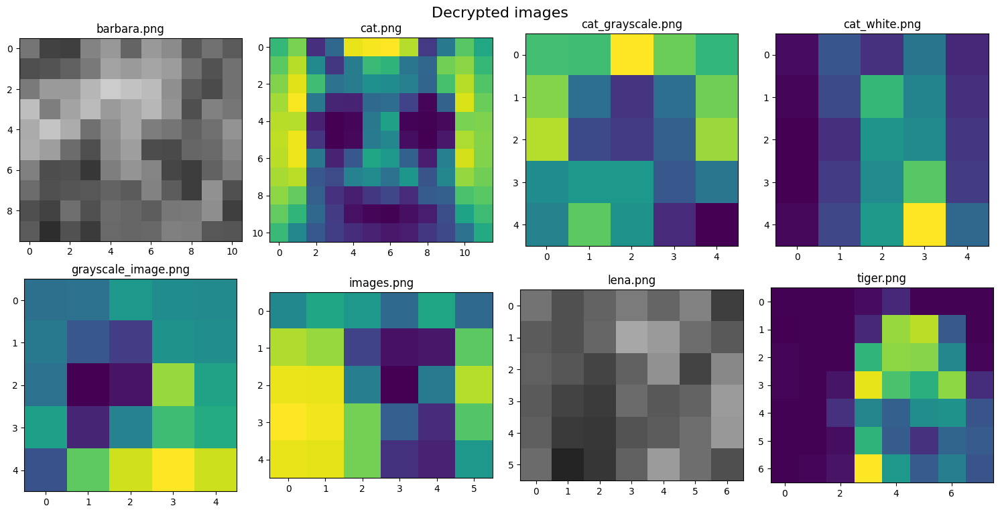

In [8]:
print("---------------------------------------------------------")
print("\t\tDecryption Initial Parameters")
print("---------------------------------------------------------")

print("1. kC_cipher: \n", kC_cipher)
print("\n2. kC_cipher_minus: \n", kC_cipher_minus)
print("\n3. kP_cipher_plus: \n", kP_cipher_plus)

# Recover shared key
system_equations = RVK.copy()
system_equations[:dicom_global_params.K] = PK0[:dicom_global_params.K]
S0 = bf.recover_shared_key(system_equations)
print("\n6. system_equations: \n", system_equations)
print("\n7. S0: \n", S0)
S = str(S0)
print("\n8. S: \n", S)

# PK
PK = []
for k in range(dicom_global_params.K):
    pk_k = bf.xor(PK0[k], RCPK[k])
    PK.append(pk_k)
print("\n9. PK: \n", PK)

PCF = [("0" * dicom_global_params.NB_max) for _ in range(dicom_global_params.K)]
print("\n10. PCF: ", PCF)

print("\n\n")

print("=============================START DECRYPTION PROCESSING=============================")
for n in range(dicom_global_params.Ne - 1, -1, -1):
    start_time = time.time() # Record start time in seconds unit
    print("\n")
    print("\t---------------------------------------------------------")
    print("\t-------------------|      STEP ",n,"   |-------------------")
    print("\t---------------------------------------------------------\n")
    for i in range(real_M_max - 1, -1, -1):
        for j in range(real_N_max - 1, -1, -1):
            print("------------------------")
            print("|    Pixel ["+ str(i)+ "], [" + str(j) + "]    |")
            print("------------------------")

            # phi_S
            phi_S = bf.cal_phi_S(n       = n                         , 
                                 XY      = [i, j]                    , 
                                 rvk_K   = RVK[dicom_global_params.K] )
            print("\n1. phi_S: \n", phi_S, "\n")

            # Private Constraint Function
            PCF = bf.private_constraint_function(ID           = ID             , 
                                                 PCF          = PCF            , 
                                                 PK           = PK             , 
                                                 XY           = [i, j]         , 
                                                 kP_plus      = kP_cipher_plus , 
                                                 kC_minus     = kC_cipher_minus, 
                                                 list_im_size = list_im_size   )
            print("2. PCF: \n", PCF, "\n")

            # Update S
            S = bf.update_S(S0     = S0  , 
                            phi_S = phi_S )
            print("3. S: \n", S)

            # Bit Manipulation before Cat PCM
            E = bf.bit_manipulation(s1          = S                      , 
                                    s2          = ""                     , 
                                    output_size = dicom_cat_params.k1_cat )
            print("\n4. E: \n", E, "\n")

            # PCM Cat
            X_R = bf.pcm_cat(E           = E                           , 
                             Y1_FAST_Cat = dicom_cat_params.Y1_FAST_Cat, 
                             Y2_FAST_Cat = dicom_cat_params.Y2_FAST_Cat, 
                             Y3_FAST_Cat = dicom_cat_params.Y3_FAST_Cat, 
                             Y4_FAST_Cat = dicom_cat_params.Y4_FAST_Cat, 
                             R           = R_iterations                 )
            print("\n5. X_R: \n", X_R, "\n")

            # XY, phi generation
            XY_new, phi_source, phi_dest = bf.xy_phi_generation(X_R              = X_R                               , 
                                                                Yp_MN            = Yp_MN                             , 
                                                                Y_phi_source     = dicom_cat_params.Yd_phi_source_Cat, 
                                                                Y_phi_dest       = dicom_cat_params.Yd_phi_dest_Cat   )
            print("\n6. XY_new: \n", XY_new, "\n")
            print("7. phi_source: \n", phi_source, "\n")
            print("8. phi_dest: \n", phi_dest, "\n")

            # Bit Pre-processing for all images
            XY_P, phi_source_P, phi_dest_P = bf.bit_pre_processing(XY                = [i, j]            , 
                                                                   XY_new            = XY_new            , 
                                                                   PCF               = PCF               , 
                                                                   phi_source        = phi_source        , 
                                                                   phi_dest          = phi_dest          , 
                                                                   list_im_size      = list_im_size      , 
                                                                   list_num_bits_pre = list_num_bits_pre )
            print("\n9. XY_P: \n", XY_P, "\n")
            print("10. phi_source_P: \n", phi_source_P, "\n")
            print("11. phi_dest_P: \n", phi_dest_P, "\n")

            # Permutation and Diffusion for Decryption process
            kC_cipher_minus, kP_cipher_plus, kC_cipher = bf.dicom_mie_perm_diff_dec(ID           = ID             , 
                                                                                    kC           = kC_cipher      , 
                                                                                    XY           = [i, j]         , 
                                                                                    XY_P         = XY_P           , 
                                                                                    phi_source_P = phi_source_P   , 
                                                                                    phi_dest_P   = phi_dest_P     , 
                                                                                    prev_kP_plus = kP_cipher_plus , 
                                                                                    kC_minus     = kC_cipher_minus, 
                                                                                    list_im_size = list_im_size   , 
                                                                                    n            = n               )
            print("\n12. kC_cipher_minus: \n", kC_cipher_minus, "\n")
            print("\n13. kP_cipher_plus: \n", kP_cipher_plus, "\n")
            print("\n14. kC_cipher: \n", kC_cipher, "\n")

            # Update PK
            PK = bf.update_private_key(XY           = [i, j]      , 
                                       PK           = PK          , 
                                       phi_S        = phi_S       , 
                                       list_im_size = list_im_size )
            print("15. PK: \n", PK, "\n")

    end_time = time.time() # Record end time in senconds unit
    print("Simulation time of step ", n, ": ", end_time - start_time)

kC_cipher_merge = merge_images(kI = kC_cipher, 
                               ID = ID        )

save_images(kC_cipher_merge, dir_decrypted, str_Fnames_cipher)
show_images(kI = kC_cipher_merge, suptitle = 'Decrypted images', str_Fnames = str_Fnames_cipher, 
            size = (15, 15), rows = 4, cols = 4)